## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

# Import Libraries

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt
%matplotlib inline
plt.rcParams["figure.figsize"] = (12, 9)

# Functions

## Camera Calibration

In [2]:
def camera_calibration(nx, ny, images, show_steps = 0, show_images = 0):
    """
    Compute the camera calibration matrix and distortion coefficients.
    They are computed once and we will apply them to undistort each new frame.
    """
    print("We have {} images for calibration.".format(len(images)))
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    for fname in images:
        img  = mpimg.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        img_corners = img.copy()
        
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
        
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img_corners, (nx,ny), corners, ret)   
        
        if show_steps == 1:
            if ret == True:
                print("Current image is '{}' and is successfully calibrated".format(fname.split("/")[-1]))
            else:
                print("Current image is '{}' and is failed to calibrate".format(fname.split("/")[-1]))
                
        if show_images == 1:
            plt.figure(figsize=(15,3))
            plt.suptitle(fname.split("/")[-1])
            plt.subplot(1,3,1)
            plt.imshow(img)
            plt.title("Original Image")
            plt.subplot(1,3,2)
            plt.imshow(gray,cmap='gray')
            plt.title("Gray Image")
            if ret == True:
                plt.subplot(1,3,3)
                plt.imshow(img_corners)
                plt.title("Image with Corners")      
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    print("Calibration is finished")
    return ret, mtx, dist, rvecs, tvecs

images = glob.glob('../camera_cal/calibration*.jpg')
nx = 9 #the number of inside corners in x
ny = 6 #the number of inside corners in y    
ret, mtx, dist, rvecs, tvecs = camera_calibration(nx, ny, images, show_steps = 0,  show_images = 0)

We have 20 images for calibration.
Calibration is finished


## Distortion Correction

In [3]:
def distortion_correction(img, mtx, dist, plot=0):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    if plot == 1:
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(undistorted)
        ax2.set_title('Undistorted Image', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return undistorted

img = mpimg.imread('../test_images/straight_lines1.jpg') 
undistorted = distortion_correction(img, mtx, dist, plot = 0)

## Color Threshold

In [117]:
def color_threshold(img, thresh=(0, 255), plot = 0):
    """
    function that thresholds the S-channel of HLS
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    if plot == 1:
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        #plt.suptitle("Change", fontsize=30)
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('Thresholded S', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return binary_output

if 0:
    images = glob.glob('../test_images/*.jpg')
    for fname in images:
        img  = mpimg.imread(fname)    
        undistorted = distortion_correction(img, mtx, dist, plot = 0)
        binary_output = color_threshold(undistorted, thresh=(90, 255), plot = 1)

## Gradient Thresholds 

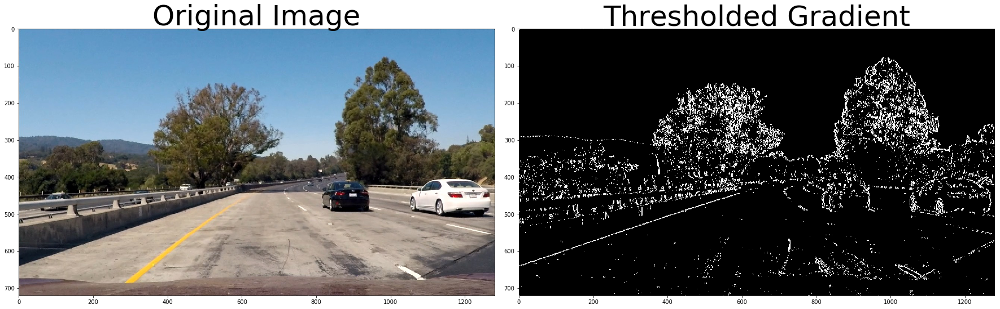

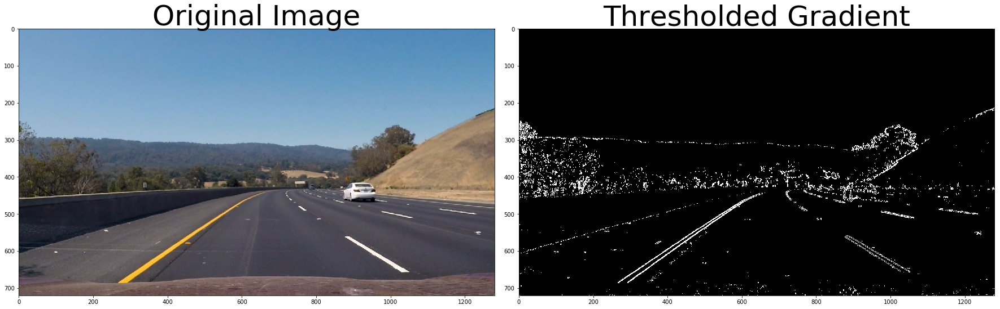

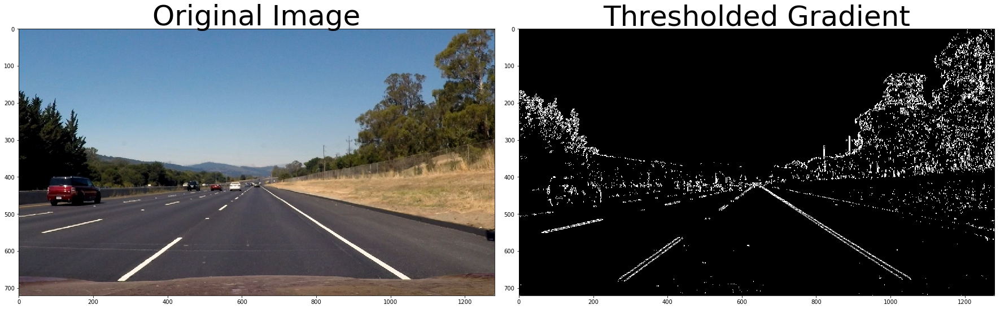

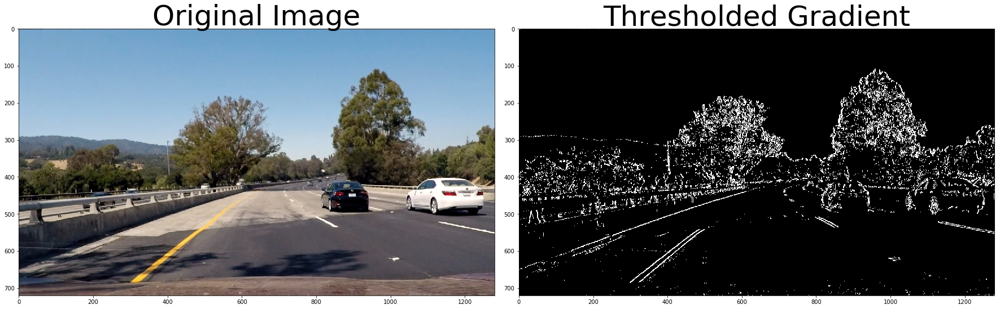

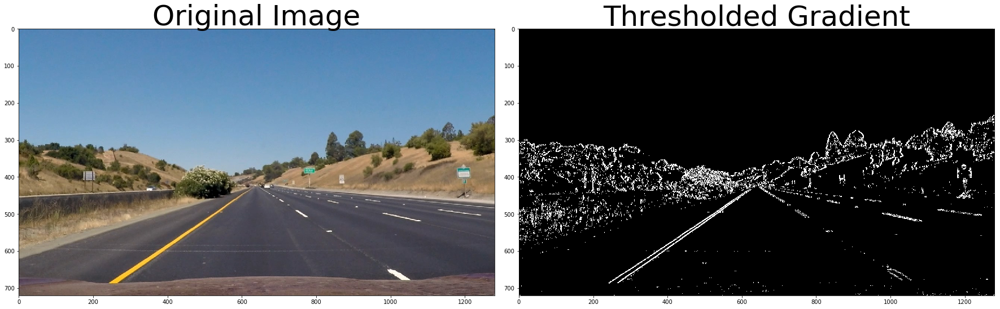

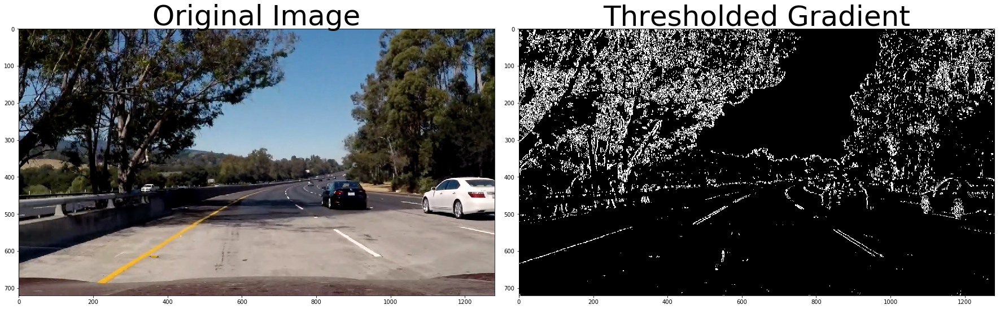

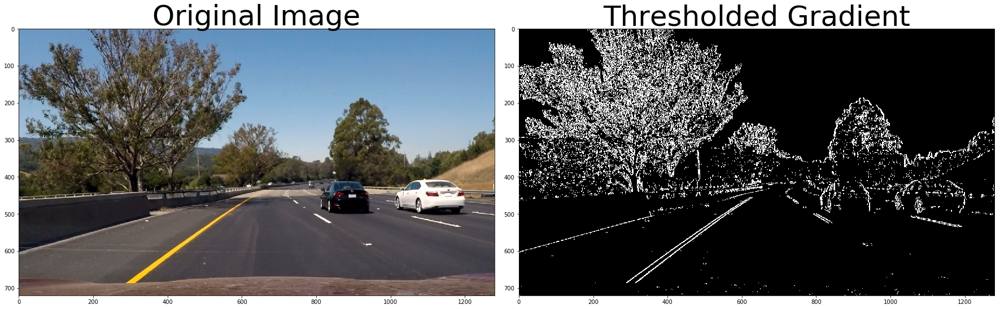

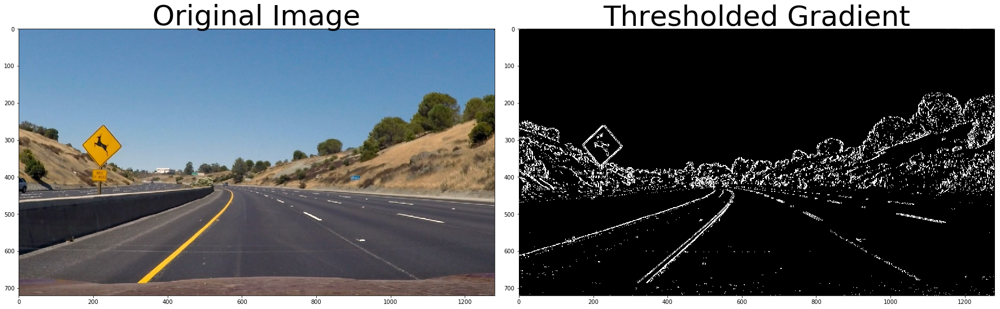

In [119]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh_min) & (scaled_sobel<=thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
 

    
if 1:   
    images = glob.glob('../test_images/*.jpg')
    for fname in images:
        img  = mpimg.imread(fname) 
        gray  = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Run the function
        grad_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh_min=20, thresh_max=100)
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(grad_binary, cmap='gray')
        ax2.set_title('Thresholded Gradient', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective Transform

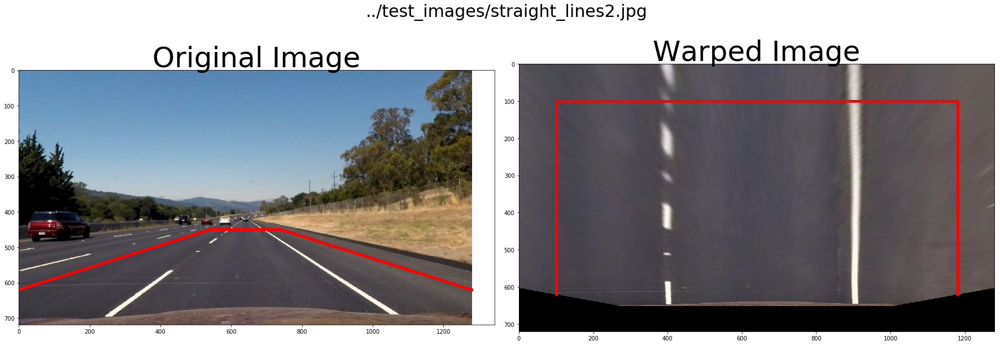

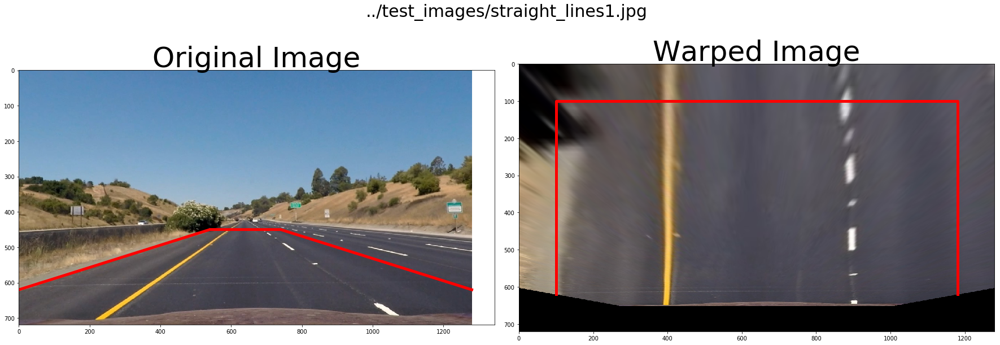

In [136]:
def perspective_transform(img, offset = 100, plot = 0):
    """
    src = np.float32([[210, imshape[0]],
                      [520, 500], 
                      [765, 500], 
                      [1100, imshape[0]]])
                      
    src = np.float32([[210,  img_size[1]],
                      [595,  450], 
                      [688,  450], 
                      [1100, img_size[1]]])
    """
    img_size = (img.shape[1],img.shape[0])
    """
    src_bottom_left  = (210,  img_size[1])
    src_upper_left   = (595,  450)
    src_upper_right  = (688,  450)
    src_bottom_right = (1100, img_size[1])
    """
    """
    src_bottom_left  = (0,    720)
    src_upper_left   = (570,  450)
    src_upper_right  = (710,  450)
    src_bottom_right = (1280, 720)
    """
    
    src_bottom_left  = (0,    620)
    src_upper_left   = (540,  450)
    src_upper_right  = (740,  450)
    src_bottom_right = (1280, 620)
    
    
    dst_bottom_left  = (offset,              img_size[1]-offset)
    dst_upper_left   = (offset,              offset)
    dst_upper_right  = (img_size[0]-offset,  offset)
    dst_bottom_right = (img_size[0]-offset,  img_size[1]-offset)

    src = np.float32([src_bottom_left, src_upper_left, src_upper_right, src_bottom_right])
    dst = np.float32([dst_bottom_left, dst_upper_left, dst_upper_right, dst_bottom_right])
    
    M    = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    binary_warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    
    
    if plot == 1:
        src_x = [src[0][0], src[1][0], src[2][0], src[3][0]]
        src_y = [src[0][1], src[1][1], src[2][1], src[3][1]]
        
        dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0]]
        dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1]]
                
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img);
        ax1.plot(src_x, src_y, 'r', lw=5);
        ax1.set_title('Original Image', fontsize=50)
        
        ax2.imshow(binary_warped);
        ax2.plot(dst_x, dst_y, 'r', lw=5);
        ax2.set_title('Warped Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return binary_warped, M, Minv

if 1:
    images = glob.glob('../test_images/stra*.jpg')
    for fname in images:
        img  = mpimg.imread(fname)
        undistorted = distortion_correction(img, mtx, dist)
        binary_warped, M, Minv = perspective_transform(undistorted, plot = 1)  
        plt.suptitle(fname, fontsize=30)

# =============================================================

In [7]:
def add_lane_line_to_graph(left_fitx, right_fitx, ploty):
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx,  ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

In [84]:
def find_one_lane(binary_warped, orient = "left", nwindows = 10, margin = 100, minpix = 50):
    """
    HYPERPARAMETERS:
        - nwindows = 10     # Choose the number of sliding windows
        - margin   = 100    # Set the width of the windows +/- margin
        - minpix   = 50     # Set minimum number of pixels found to recenter window
        - orient   = "left" # left or right lane
    """
    out_img   = np.dstack((binary_warped, binary_warped, binary_warped))
        
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    midpoint  = np.int(histogram.shape[0]//2)
       
    if orient.lower() == "left":
        x_base  = np.argmax(histogram[:midpoint])
    elif orient.lower() == "right":
        x_base = np.argmax(histogram[midpoint:]) + midpoint
    else:
        print("Wrong Orient")
        exit()
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    lane_inds = [] # Create empty lists to receive lane pixel indices
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low  = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] -  window   *window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_x_low   = x_base  - margin
        win_x_high  = x_base  + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_x_low,win_y_low),  (win_x_high,win_y_high), (0,255,0), 4) 
        
        # Identify the nonzero pixels in x and y within the window ###
        good_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                      (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
        
        # Append these indices to the lists
        lane_inds.append(good_inds)
        
        if len(good_inds) > minpix:
            x_base = np.int(np.mean(nonzerox[good_inds]))

    lane_inds  = np.concatenate(lane_inds)

    fit_x = nonzerox[lane_inds]
    fit_y = nonzeroy[lane_inds]  
    
    out_img[fit_y, fit_x] = [255, 0, 0]
    
    return fit_x, fit_y, out_img

In [85]:
def find_lane_pixels(binary_warped, show_images = 0):
    leftx, lefty, out_img1   = find_one_lane(binary_warped, orient = "left")
    rightx, righty, out_img2 = find_one_lane(binary_warped, orient = "right")

    out_l = out_img1[:,0:out_img1.shape[1]//2]
    out_r = out_img2[:, out_img2.shape[1]//2:] 
    out_img = cv2.hconcat([out_l, out_r])
    
    if show_images == 1:
        plt.imshow(out_img)
    
    return leftx, lefty, rightx, righty, out_img

left_fit  = [ -8.26253931e-05   6.31208075e-02   3.93379351e+02]
right_fit = [  5.18046897e-05  -7.27852603e-02   9.28343915e+02]


'\nprint(binary_warped.shape)\nprint(out_img.shape)\nplt.figure()\nplt.imshow(cv2.addWeighted(undistorted, 1, out_img, 1, 0))\n\n'

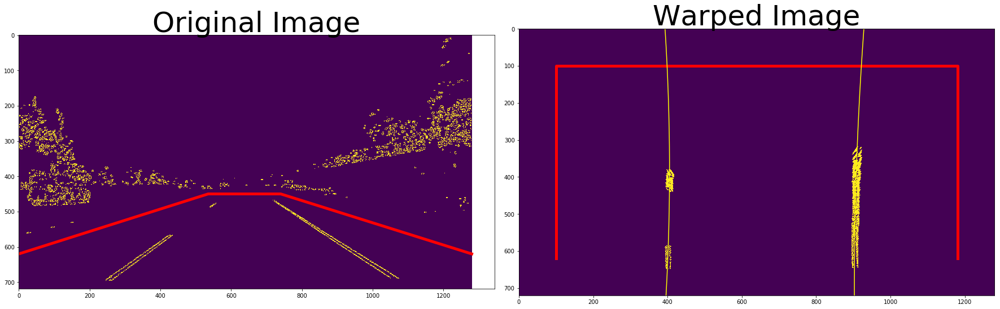

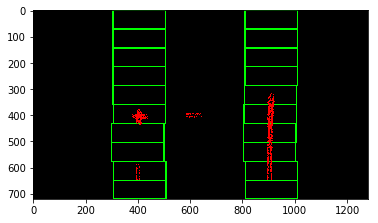

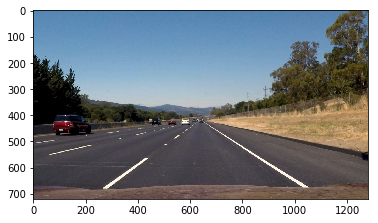

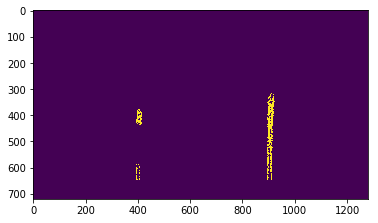

In [132]:
def fit_poly(img_shape, leftx, lefty, rightx, righty, debug = 0):
    """
    Fit a second order polynomial to each with np.polyfit()
    
    Function used:
        # numpy.polyfit(x, y, deg, rcond=None, full=False, w=None, cov=False)
        # numpy.linspace(start, stop, num=50, endpoint=True, retstep=False, dtype=None, axis=0)
    
    """
    left_fit  = np.polyfit(lefty,  leftx,  2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty      = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    left_fitx  = left_fit[0] *ploty**2 + left_fit[1] *ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    if debug == 1:
        print("left_fit  =", left_fit)
        print("right_fit =", right_fit)
        
        
    return left_fitx, right_fitx, ploty



img = mpimg.imread('../test_images/straight_lines2.jpg') 
undistorted = distortion_correction(img, mtx, dist)
hls_binary = color_threshold(undistorted, thresh=(150, 255))
grad_binary = abs_sobel_thresh(hls_binary, orient='x', sobel_kernel=5, thresh_min=50, thresh_max=150)
binary_warped, M, Minv = perspective_transform(grad_binary, plot = 1) 
leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty, debug = 1)

add_lane_line_to_graph(left_fitx, right_fitx, ploty)
plt.imshow(binary_warped)

plt.figure()
#add_lane_line_to_graph(left_fitx, right_fitx, ploty)
out_img[leftx, lefty] = [255, 0, 0]
plt.imshow(out_img)

plt.figure()
plt.imshow(img)

plt.figure()
plt.imshow(binary_warped)


"""
print(binary_warped.shape)
print(out_img.shape)
plt.figure()
plt.imshow(cv2.addWeighted(undistorted, 1, out_img, 1, 0))

"""

In [64]:
def measure_curvature_real(leftx, lefty, rightx, righty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 /720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    
    left_fit_cr  = np.polyfit(lefty *ym_per_pix, leftx *xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### Calculation of R_curve (radius of curvature) #####
    left_curverad  = ((1 + (2*left_fit_cr [0]*y_eval*ym_per_pix + left_fit_cr [1])**2)**1.5) / np.absolute(2*left_fit_cr [0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])    
    
    return left_curverad, right_curverad

left_curverad, right_curverad = measure_curvature_real(leftx, lefty, rightx, righty)
print(left_curverad, right_curverad)

288.906401331 364.609072026


In [46]:
def add_curvature_image(image, left_curverad, right_curverad):
    """
    Syntax: cv2.putText(image, text, org, font, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]])

    Parameters:
    image: It is the image on which text is to be drawn.
    text: Text string to be drawn.
    org: It is the coordinates of the bottom-left corner of the text string in the image. The coordinates are represented as tuples of two values i.e. (X coordinate value, Y coordinate value).
    font: It denotes the font type. Some of font types are FONT_HERSHEY_SIMPLEX, FONT_HERSHEY_PLAIN, , etc.
    fontScale: Font scale factor that is multiplied by the font-specific base size.
    color: It is the color of text string to be drawn. For BGR, we pass a tuple. eg: (255, 0, 0) for blue color.
    thickness: It is the thickness of the line in px.
    lineType: This is an optional parameter.It gives the type of the line to be used.
    bottomLeftOrigin: This is an optional parameter. When it is true, the image data origin is at the bottom-left corner. Otherwise, it is at the top-left corner.

    Return Value: It returns an image.
    """
    font      = cv2.FONT_HERSHEY_SIMPLEX 
    fontScale = 2                        
    color     = (255, 255, 255)
    thickness =  2    
    
    l_text = "Left  Radius of Curvature {:.0f}m".format(left_curverad) 
    r_text = "Right Radius of Curvature {:.0f}m".format(right_curverad) 
    l_org  = (120,60) 
    r_org  = (120,120) 
    
    output = cv2.putText(image,  l_text, l_org, font, fontScale, color, thickness, cv2.LINE_AA)
    output = cv2.putText(output, r_text, r_org, font, fontScale, color, thickness, cv2.LINE_AA)
    
    return output

## lane_area_drawn

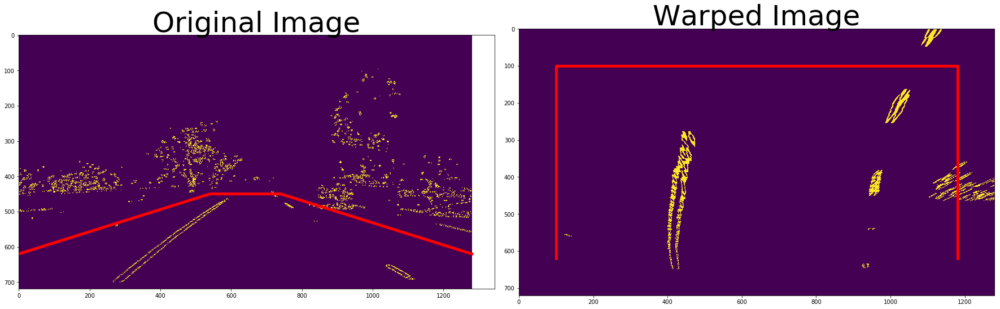

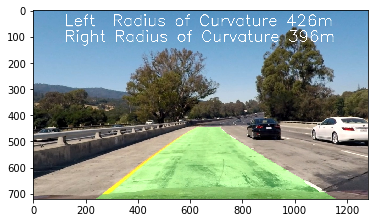

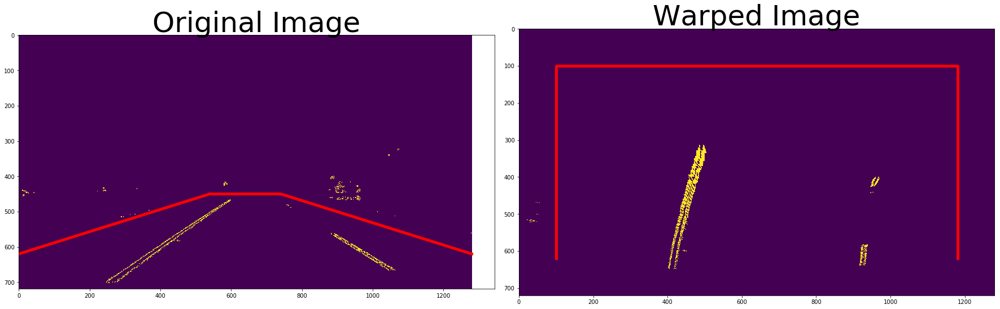

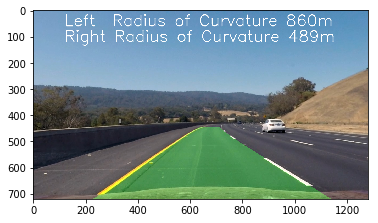

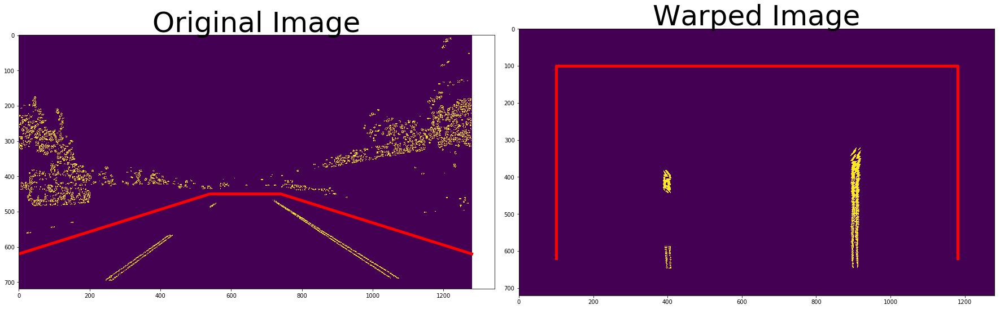

...

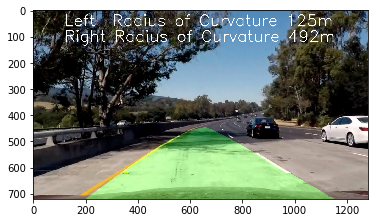

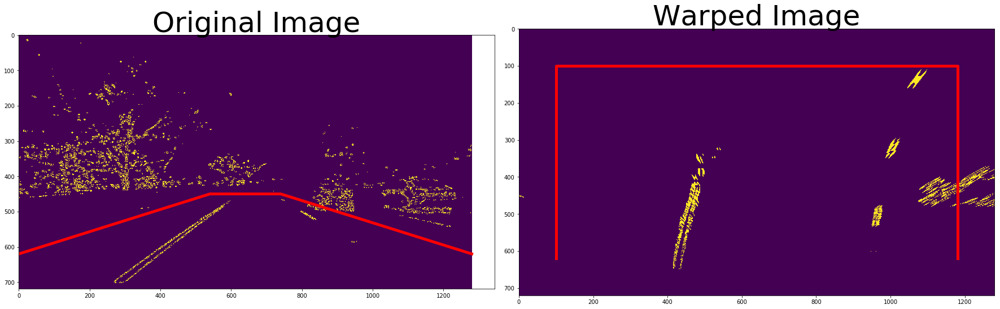

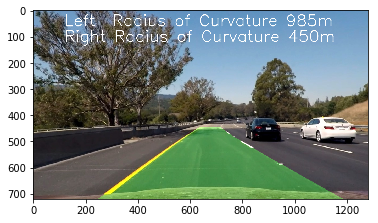

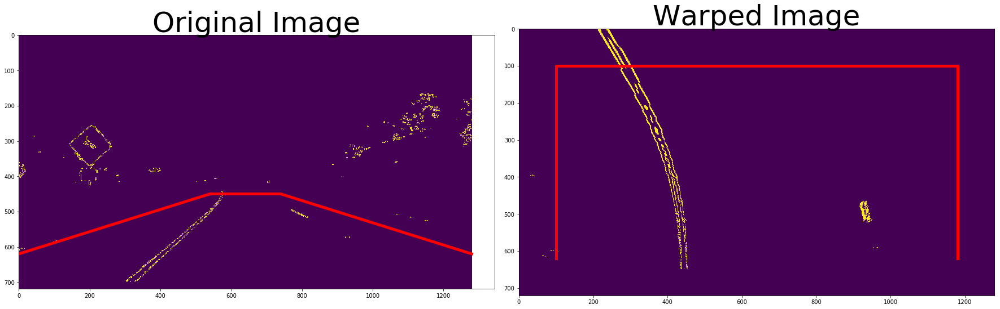

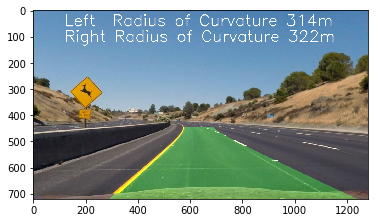

In [139]:
def lane_area_drawn(binary_warped, undistorted , ploty, left_fitx, right_fitx, Minv):
    # Create an image to draw the lines on
    warp_zero  = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    output = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    
    output = add_curvature_image(output, left_curverad, right_curverad)
    
    #plt.imshow(output)
    return output

images = glob.glob('../test_images/*.jpg')
for fname in images:
    img  = mpimg.imread(fname)
    undistorted = distortion_correction(img, mtx, dist)
    hls_binary = color_threshold(undistorted, thresh=(150, 255))
    grad_binary = abs_sobel_thresh(hls_binary, orient='x', sobel_kernel=5, thresh_min=50, thresh_max=150)
    binary_warped, M, Minv = perspective_transform(grad_binary, plot = 1) 
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty, debug = 0)
    left_curverad, right_curverad = measure_curvature_real(leftx, lefty, rightx, righty)
    Ouput = lane_area_drawn(binary_warped, undistorted, ploty, left_fitx, right_fitx, Minv)
    plt.figure()
    plt.imshow(Ouput)

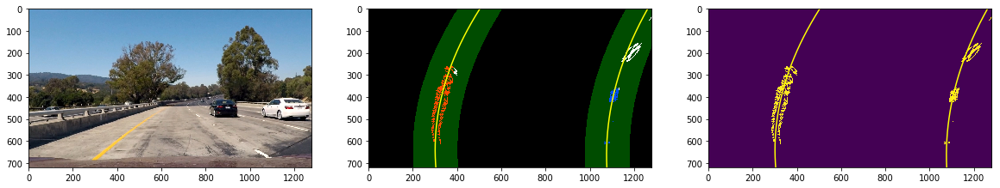

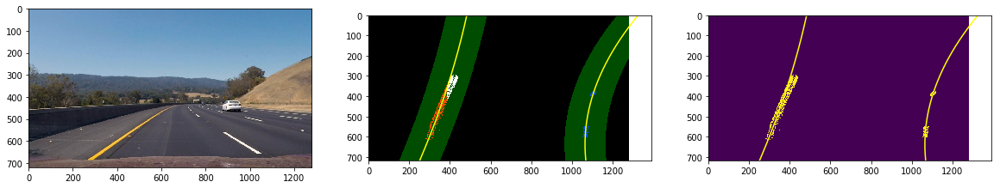

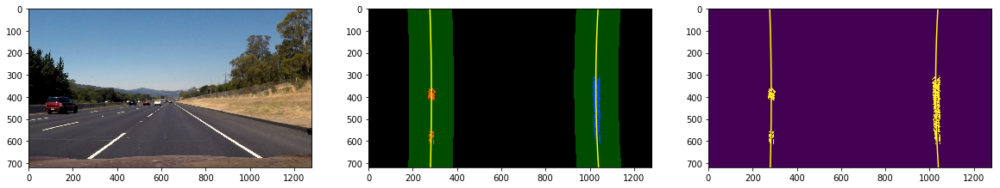

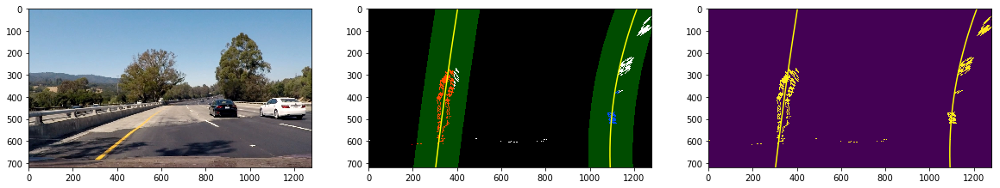

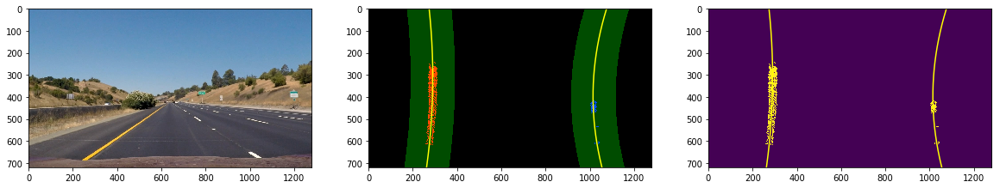

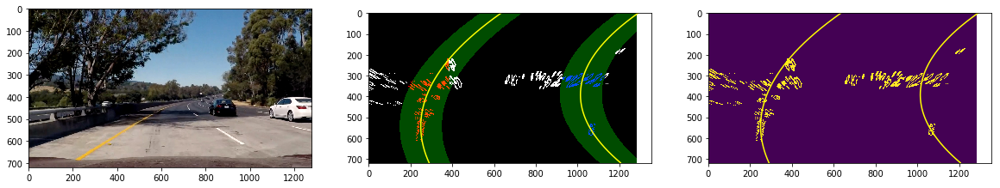

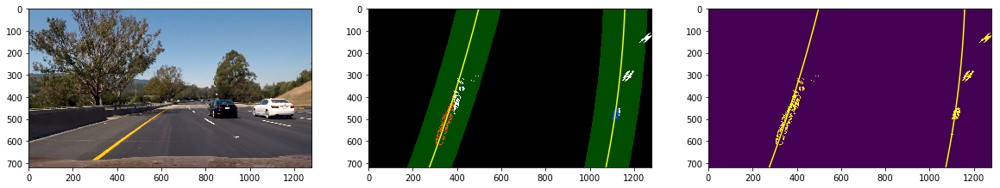

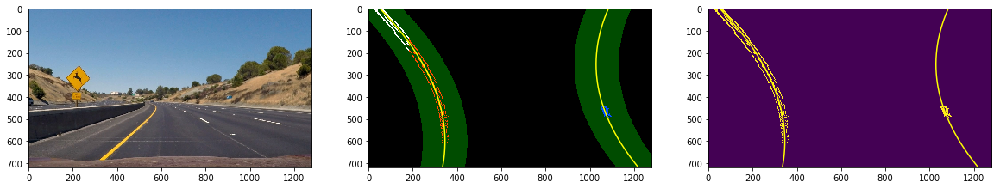

In [83]:
#left_fit  = np.array([ -2.52230546e-04,   2.04420298e-01,   6.66583788e+01])
#right_fit = np.array([  5.95858838e-04,  -5.30126359e-01,   1.28838583e+03])

left_fit  = np.polyfit(lefty,  leftx,  2)
right_fit = np.polyfit(righty, rightx, 2)
def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero  = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fitx, right_fitx, ploty

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits

images = glob.glob('../test_images/*.jpg')
for fname in images:
    img  = mpimg.imread(fname)
    undistorted = distortion_correction(img, mtx, dist)
    hls_binary = color_threshold(undistorted, thresh=(150, 255))
    grad_binary = abs_sobel_thresh(hls_binary, orient='x', sobel_kernel=5, thresh_min=50, thresh_max=150)
    binary_warped, M, Minv = perspective_transform(grad_binary, plot = 0) 
    result, left_fitx, right_fitx, ploty = search_around_poly(binary_warped)

    # View your output
    plt.figure(figsize=(20, 9))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.subplot(1,3,2)
    plt.imshow(result)
    add_lane_line_to_graph(left_fitx, right_fitx, ploty)
    plt.subplot(1,3,3)
    plt.imshow(binary_warped)
    add_lane_line_to_graph(left_fitx, right_fitx, ploty)

In [ ]:
def fit_poly_one(img_shape, x, y, debug = 0):
    """
    Fit a second order polynomial to each with np.polyfit()
    
    Function used:
        # numpy.polyfit(x, y, deg, rcond=None, full=False, w=None, cov=False)
        # numpy.linspace(start, stop, num=50, endpoint=True, retstep=False, dtype=None, axis=0)
    
    """
    coef  = np.polyfit(y, x, 2)
    plot_y = np.linspace(0, img_shape[0]-1, img_shape[0])
    plot_x = coef[0] *plot_y**2 + coef[1] *plot_y + coef[2]
        
    if debug == 1:
        print("coefficient  =", coef)
        
    return plot_x, plot_y

## fit_polynomial

In [ ]:
def fit_polynomial(binary_warped, show_images = 0):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, show_images = 0)    
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty, debug=0)

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx]   = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    if show_images == 1:
        # Plots the left and right polynomials on the lane lines
        plt.figure()
        plt.plot(left_fitx,  ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return out_img

out_img = fit_polynomial(binary_warped, show_images = 0)

plt.imshow(out_img)

## Pipeline

In [ ]:
# Compute the camera calibration matrix and distortion coefficients. 
nx = 9 #the number of inside corners in x
ny = 6 #the number of inside corners in y  
images = glob.glob('../camera_cal/calibration*.jpg')
ret, mtx, dist, rvecs, tvecs = camera_calibration(nx, ny, images, show_steps = 0,  show_images = 0) 

In [96]:
def lane_line_pipeline(img):
    undistorted = distortion_correction(img, mtx, dist)
    hls_binary = color_threshold(undistorted, thresh=(150, 255))
    grad_binary = abs_sobel_thresh(hls_binary, orient='x', sobel_kernel=5, thresh_min=50, thresh_max=150)
    binary_warped, M, Minv = perspective_transform(grad_binary, plot = 0) 
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty, debug = 0)
    Ouput = lane_area_drawn(binary_warped, undistorted, ploty, left_fitx, right_fitx, Minv)
    return Ouput

# Video

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [97]:
def process_image(image):
    result = lane_line_pipeline(image)
    return result

In [106]:
input_video = '../project_video.mp4'
output_video = input_video.split("/")[-1]
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip = VideoFileClip(input_video)
out_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time out_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video project_video.mp4
[MoviePy] Writing video project_video.mp4


 49%|████▊     | 614/1261 [01:44<02:17,  4.71it/s]

TypeError: expected non-empty vector for x

In [107]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [ ]:
def add_curve(image, x, y):  
    image[y, x] = [255, 0, 0]
    return image

In [ ]:
# Distortion Correction
img = mpimg.imread('../test_images/straight_lines1.jpg') 
undistorted = distortion_correction(img, mtx, dist)

# Color Threshold
hls_binary = color_threshold(undistorted, thresh=(150, 255))

# Gradient Thresold
grad_binary = abs_sobel_thresh(hls_binary, orient='x', sobel_kernel=5, thresh_min=50, thresh_max=150)

# Perspective Transform
binary_warped, M, Minv = perspective_transform(grad_binary, plot = 0)   

out_img = fit_polynomial(binary_warped)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Start Image', fontsize=50)
ax2.imshow(out_img, cmap='gray')
ax2.set_title('End Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
def generate_data():
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    
    return ploty, left_fit, right_fit

def measure_curvature_pixels():
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit, right_fit = generate_data()
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad  = ((1 + (2*left_fit [0]*y_eval + left_fit [1])**2)**1.5) / np.absolute(2*left_fit [0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels()

print(left_curverad, right_curverad)
# Should see values of 1625.06 and 1976.30 here, if using
# the default `generate_data` function with given seed number

In [ ]:
def generate_data(ym_per_pix, xm_per_pix):
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    ##### TO-DO: Fit new polynomials to x,y in world space #####
    ##### Utilize `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr = np.polyfit(ploty *ym_per_pix, leftx *xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return ploty, left_fit_cr, right_fit_cr

    
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad  = ((1 + (2*left_fit_cr [0]*y_eval*ym_per_pix + left_fit_cr [1])**2)**1.5) / np.absolute(2*left_fit_cr [0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])    
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real()

print(left_curverad, 'm', right_curverad, 'm')
# Should see values of 533.75 and 648.16 here, if using
# the default `generate_data` function with given seed number
cv2.putText(img,'Hack Projects',(10,500), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
plt.imshow(img)

In [ ]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # 4) If corners found: 
    if ret == True:
        # a) draw corners
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
            #Note: you could pick any four of the detected corners 
            # as long as those four corners define a rectangle
            #One especially smart way to do this would be to use four well-chosen
            # corners that were automatically detected during the undistortion steps
            #We recommend using the automatic detection of corners in your code
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])  
        # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        offset = 200
        img_size = (gray.shape[1],gray.shape[0])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                          [img_size[0]-offset, img_size[1]-offset], 
                          [offset, img_size[1]-offset]])
        # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # e) use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist, M, img_size, flags = cv2.INTER_LINEAR)
        
    try: 
        return warped, M
    except NameError:
        return -1, -1

img = mpimg.imread('../camera_cal/calibration3.jpg')
top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
images = glob.glob('../camera_cal/calibration*.jpg')
for fname in images:
    img  = mpimg.imread(fname)
    top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    plt.suptitle(fname.split("/")[-1], fontsize=30)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    if isinstance(top_down, np.ndarray):
        ax2.imshow(top_down)
        ax2.set_title('Undistorted and Warped Image', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
#reading in an image
image = mpimg.imread('../test_images/straight_lines1.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image);  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

In [ ]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=10):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    imshape = img.shape
    
    left_slope = []
    left_inter = []
    right_slope = []
    right_inter = []
    y_upper = 320        # the lane lines in all picture are ended at this position
    y_lower = imshape[0] # the line will start at the bottom of the image
    for line in lines:
        for x1,y1,x2,y2 in line:
            #cv2.line(image, start_point, end_point, color, thickness)
            #cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                        
            if (x2-x1) !=0:
                slope = (y2-y1)/(x2-x1)
                if(slope < 0) :
                    left_slope.append(slope)
                    left_inter.append(y1-x1*slope) #  y=mx+c ==> c=y-mx
                else:
                    right_slope.append(slope)
                    right_inter.append(y1-x1*slope) #  y=mx+c ==> c=y-mx
            else:
                continue
                
            
     
    ## Left Line
    if len(left_slope)!=0 and len(left_inter)!=0:
        left_slope_mean = sum(left_slope)/len(left_slope)
        left_inter_mean = sum(left_inter)/len(left_inter)

        x1 = int((y_lower - left_inter_mean)/left_slope_mean) #y=mx+c ==> x=(y-c)/m
        y1 = int(y_lower)

        x2 = int((y_upper - left_inter_mean)/left_slope_mean) #y=mx+c ==> x=(y-c)/m
        y2 = int(y_upper)

        cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    ## Right Line
    if len(right_slope)!=0 and len(right_inter)!=0:
        right_slope_mean = sum(right_slope)/len(right_slope)
        right_inter_mean = sum(right_inter)/len(right_inter)

        x1 = int((y_lower - right_inter_mean)/right_slope_mean) #y=mx+c ==> x=(y-c)/m
        y1 = int(y_lower)

        x2 = int((y_upper - right_inter_mean)/right_slope_mean) #y=mx+c ==> x=(y-c)/m
        y2 = int(y_upper)

        cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

In [ ]:
import os
os.listdir("../test_images/")

In [ ]:
# Tuning parameteres
kernel_size = 5      # for Gaussian smoothing and is any odd number

low_threshold = 50
high_threshold = 150  

vertices = np.array([[(110,imshape[0]),(460, 320), (500, 320), (940,imshape[0])]], dtype=np.int32)

rho = 2              # distance resolution in pixels of the Hough grid
theta = np.pi/180    # angular resolution in radians of the Hough grid
threshold = 15       # minimum number of votes (intersections in Hough grid cell)
min_line_len = 40    # minimum number of pixels making up a line
max_line_gap = 20    # maximum gap in pixels between connectable line segments

In [ ]:
# detection for the testing images
plt.figure(figsize=(15,30));
for i, file in enumerate(os.listdir("../test_images/")):
    print(file)
    image = mpimg.imread("../test_images/"+file)
    lines_edges = lane_line_pipeline(image)
    plt.subplot(8,2,2*i+1).set_title(file)
    plt.imshow(image);
    plt.subplot(8,2,2*i+2).set_title("lines_edges")
    plt.imshow(lines_edges);

# Testing

## Camera Calibration

In [ ]:
images = glob.glob('../camera_cal/calibration*.jpg')
nx = 9 #the number of inside corners in x
ny = 6 #the number of inside corners in y    
ret, mtx, dist, rvecs, tvecs = camera_calibration(nx, ny, images, show_steps = 1,  show_images = 1)  

## Distortion Correction

In [ ]:
images = glob.glob('../camera_cal/calibration1.jpg')
for fname in images:
    img  = mpimg.imread(fname)
    undistorted = distortion_correction(img, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    plt.suptitle(fname.split("/")[-1], fontsize=30)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Explore test images

In [ ]:
root = "../test_images/"
test_images = os.listdir(root)
plt.figure(figsize=(20,20));
for i, file in enumerate(test_images):
    image = mpimg.imread(root+file)
    plt.subplot(len(test_images)//2,2,i+1).set_title(file)
    plt.imshow(image);

## Color Threshold

In [ ]:
image = mpimg.imread('../test_images/straight_lines1.jpg')        
hls_binary = color_threshold(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#plt.suptitle("Change", fontsize=30)
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=20, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh_min) & (scaled_sobel<=thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
 
    
image = mpimg.imread('../test_images/straight_lines1.jpg')    
gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Run the function
grad_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Magnitude of the Gradient

In [ ]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(np.power(sobel_x,2) + np.power(sobel_y,2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>mag_thresh[0]) & (scaled_sobel<=mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output

image = mpimg.imread('../test_images/straight_lines1.jpg')   
gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Run the function
mag_binary = mag_thresh(gray, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Direction of the Gradient

In [ ]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    gradient_sobel = np.arctan2(abs_sobel_y, abs_sobel_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(gradient_sobel)
    # 6) Return this mask as your binary_output image
    binary_output[(gradient_sobel>=thresh[0]) & (gradient_sobel<=thresh[1])] = 1
    #binary_output = np.copy(img) # Remove this line
    return binary_output
 
image = mpimg.imread('../test_images/straight_lines1.jpg') 
gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Run the function
dir_binary = dir_threshold(gray, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
def sobel_master(img, sobel_kernel=3, mag_thresh=(0, 255), dir_thresh=(0, np.pi/2)):
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    
    abs_sobel = np.sqrt(np.power(sobel_x,2) + np.power(sobel_y,2))
    gradient_sobel = np.arctan2(abs_sobel_y, abs_sobel_x)

    binary_output = np.zeros_like(gradient_sobel)

    binary_output[(gradient_sobel>=dir_thresh[0]) & (gradient_sobel<=dir_thresh[1])] = 1

    return binary_output
 
image = mpimg.imread('../test_images/straight_lines1.jpg') 
gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Run the function
dir_binary = dir_threshold(gray, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Create histogram of image binary activations

In [ ]:
def hist(img):
    # TO-DO: Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    #img = img/255
    #print("Shape =", img.shape)
    bottom_half = img[img.shape[0]//2:,:]

    # TO-DO: Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

# Create histogram of image binary activations
histogram = hist(grad_binary)

# Visualize the resulting histogram
plt.plot(histogram);